In [1]:
!pip install -U peft transformers diffusers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 58.7 MB/s eta 0:00:00


In [2]:
from PIL import Image

def image_grid(imgs, rows, cols, resize=256):
    assert len(imgs) == rows * cols

    if resize is not None:
        imgs = [img.resize((resize, resize)) for img in imgs]
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid


In [3]:
import torch
generator = torch.Generator("cuda").manual_seed(27827)

In [4]:
from diffusers import DiffusionPipeline,DDIMScheduler
from diffusers import DiffusionPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae, torch_dtype=torch.float16, variant="fp16",
    use_safetensors=True
)

pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.load_lora_weights("/content/pytorch_lora_weights.safetensors",weight_name="pytorch_lora_weights.safetensors", adapter_name="satvik")
pipe.enable_vae_slicing()

_ = pipe.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.w

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Recontextualization

  0%|          | 0/50 [00:00<?, ?it/s]

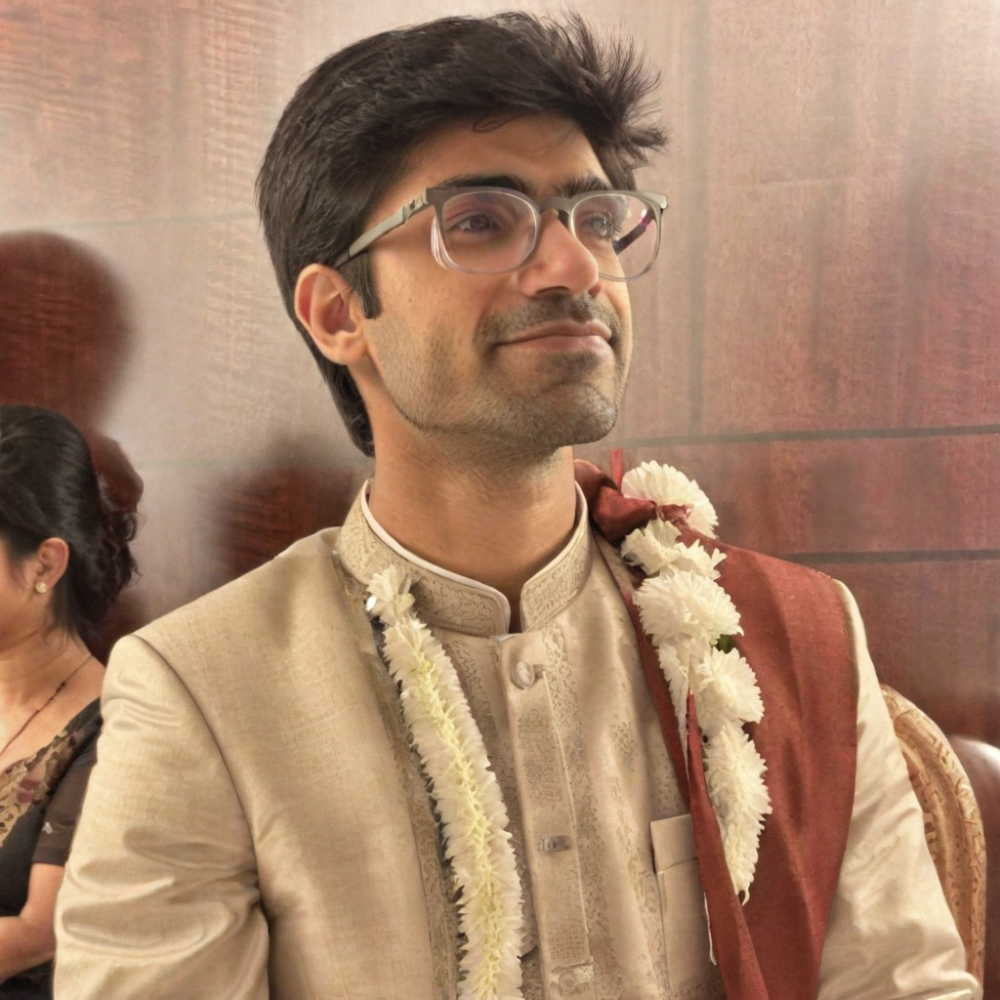

In [7]:
prompt = "a picture of Satvik person in wedding wearing indian traditional clothes"
image = pipe(prompt=prompt, num_inference_steps=50,generator=generator).images[0]
image

## Art Renditions

  0%|          | 0/80 [00:00<?, ?it/s]

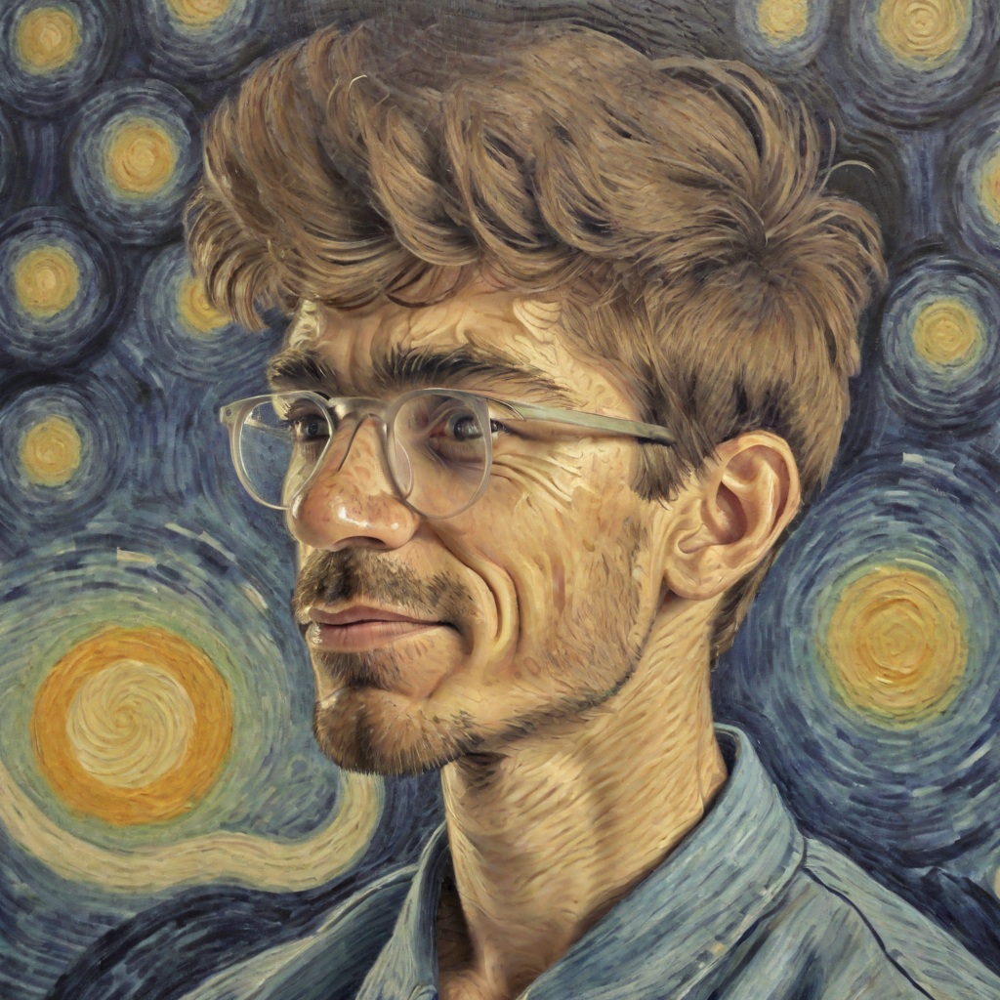

In [10]:
prompt = "a painting of Satvik person in the style of Starry Night by van gogh"
image = pipe(prompt=prompt, num_inference_steps=80,generator=generator).images[0]
image

# Property Modifications

  0%|          | 0/50 [00:00<?, ?it/s]

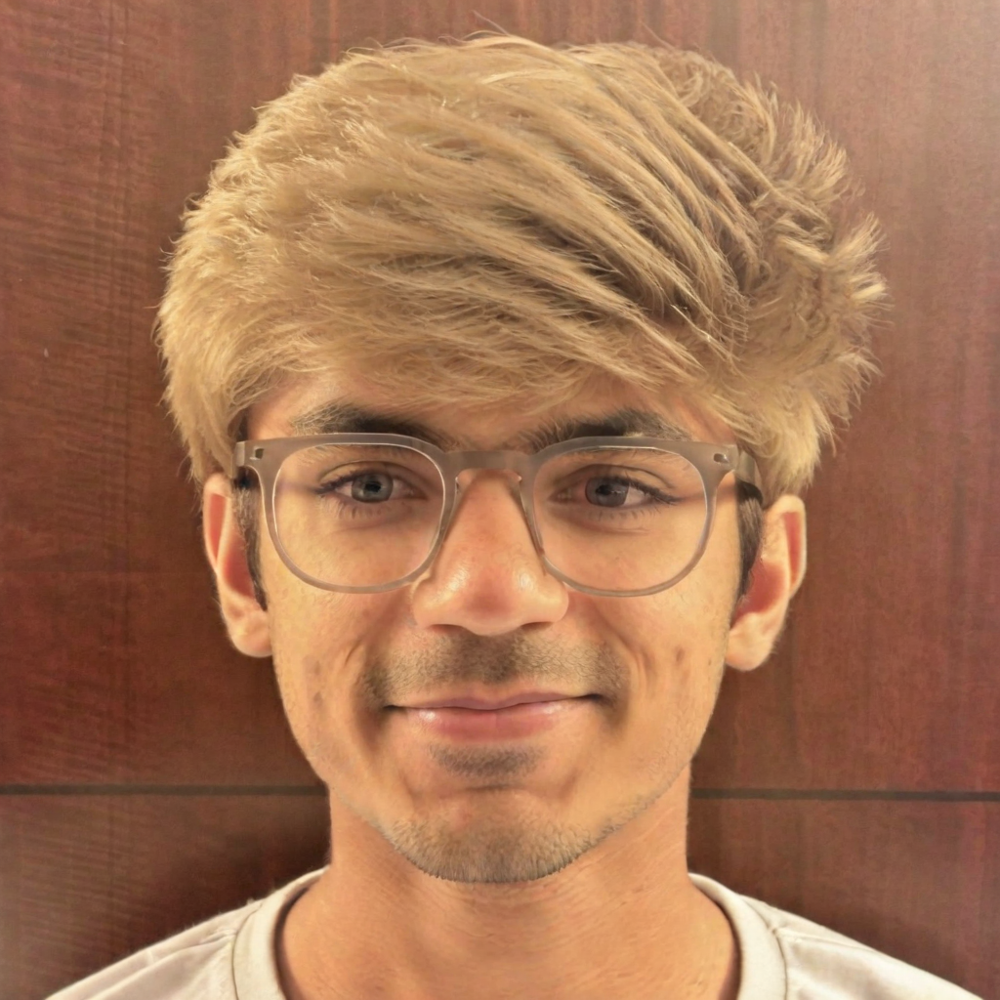

In [11]:
prompt = "a picture of Satvik person with blonde hair"
image = pipe(prompt=prompt, num_inference_steps=50,generator=generator).images[0]
image

## Accessorization

  0%|          | 0/80 [00:00<?, ?it/s]

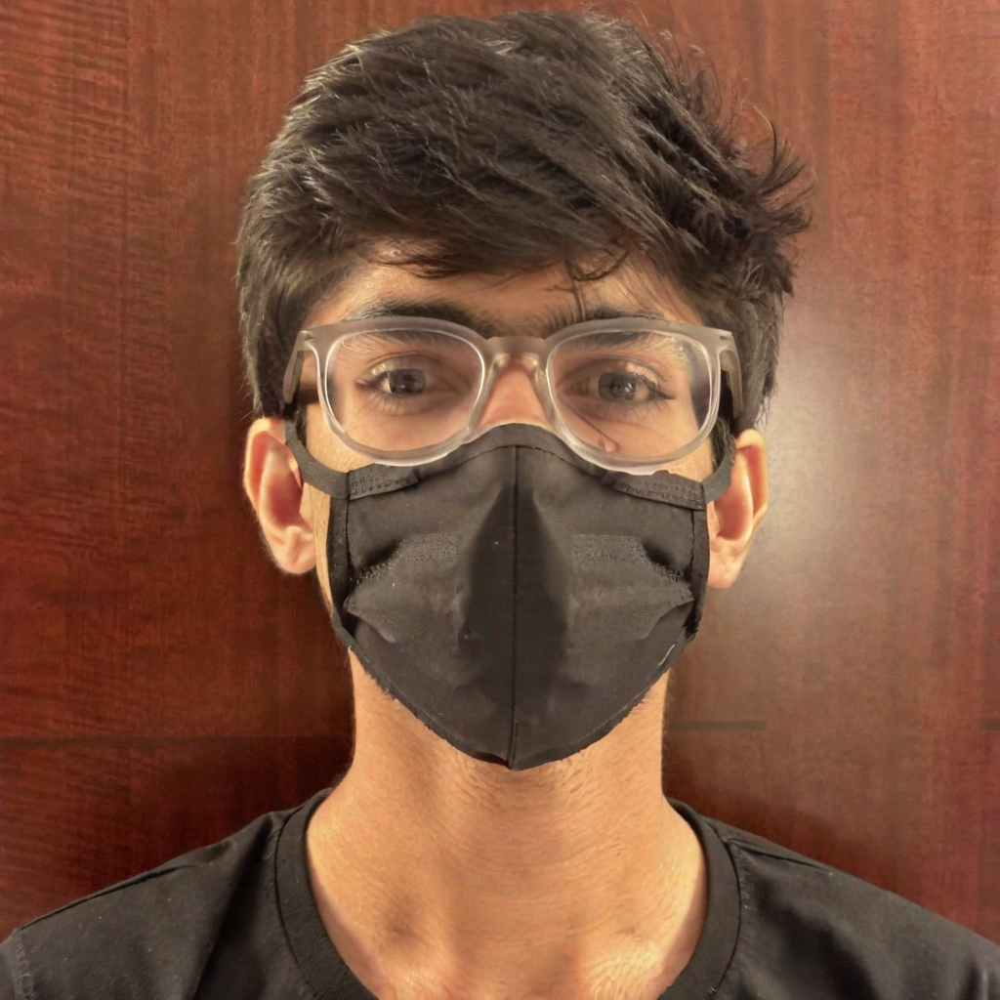

In [15]:
prompt = "a picture of Satvik person with face mask"
image = pipe(prompt=prompt, num_inference_steps=80,generator=generator).images[0]
image

## Novel-View Synthesis

  0%|          | 0/50 [00:00<?, ?it/s]

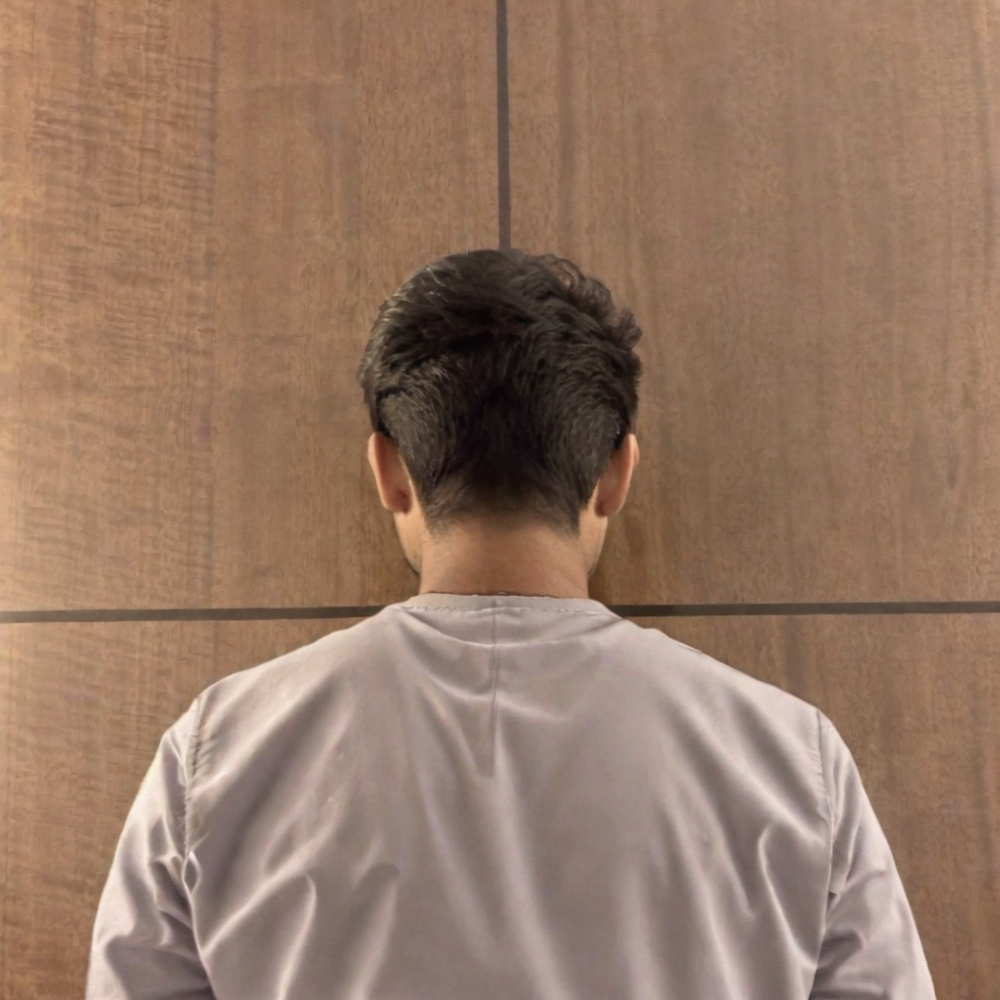

In [20]:
prompt = "a bottom view picture of Satvik person"
image = pipe(prompt=prompt, num_inference_steps=50,generator=generator).images[0]
image

## Merging Adapters - Pixel Art

In [21]:
pipe.load_lora_weights("nerijs/pixel-art-xl", weight_name="pixel-art-xl.safetensors", adapter_name="pixel")

pixel-art-xl.safetensors:   0%|          | 0.00/171M [00:00<?, ?B/s]

In [24]:
pipe.set_adapters(["pixel", "satvik"], adapter_weights=[1.2, 0.80])

  0%|          | 0/80 [00:00<?, ?it/s]

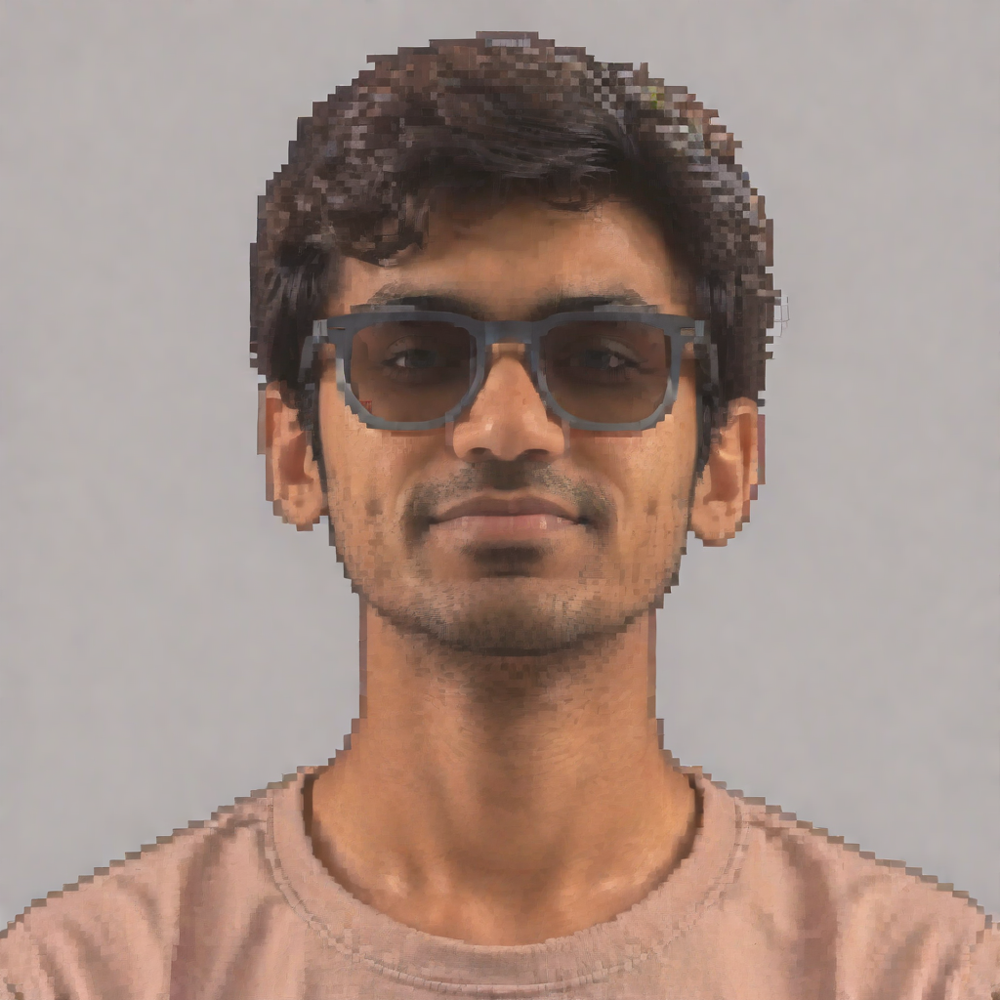

In [25]:
prompt = "pixel, a photo of Satvik person wearing sunglasses"
image = pipe(
    prompt, num_inference_steps=80, cross_attention_kwargs={"scale": 1.0},generator=generator
).images[0]
image